In [28]:
import episcanpy.api as epi
import scanpy as sc
import anndata as ad
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

In [29]:
# figure settings
sc.set_figure_params(scanpy=True, dpi=80, dpi_save=250,
                     frameon=True, vector_friendly=True,
                     color_map=None, format='pdf', transparent=False,
                     ipython_format='png2x')

# Load promoters mCG methylation

In [30]:
DATADIR = '/Users/anna.danese/Downloads/'
adata = ad.read(DATADIR+'mouse_ecker_promoters_CG.h5ad')

In [31]:
adata

AnnData object with n_obs × n_vars = 3233 × 32610 
    obs: 'cell_type', 'Library pool', 'Index i5', 'Index i7', 'i5 sequence', 'i7 sequence', 'random primer index', 'random primer index sequence', 'Total reads', 'Mapped reads', 'Filtered reads', 'mCCC/CCC', 'mCG/CG', 'mCH/CH', 'Estimated mCG/CG', 'Estimated mCH/CH', 'Neuron type', 'tSNE x coordinate', 'tSNE y coordinate\n', 'binary', 'louvain'
    uns: 'Estimated mCG', 'Estimated mCH', 'Neuron type_colors', 'binary_colors', 'cell_type_colors', 'louvain', 'louvain_colors', 'mCCC', 'mCG', 'mCH', 'neighbors', 'pca'
    obsm: 'X_pca', 'X_tsne', 'X_umap'
    varm: 'PCs'

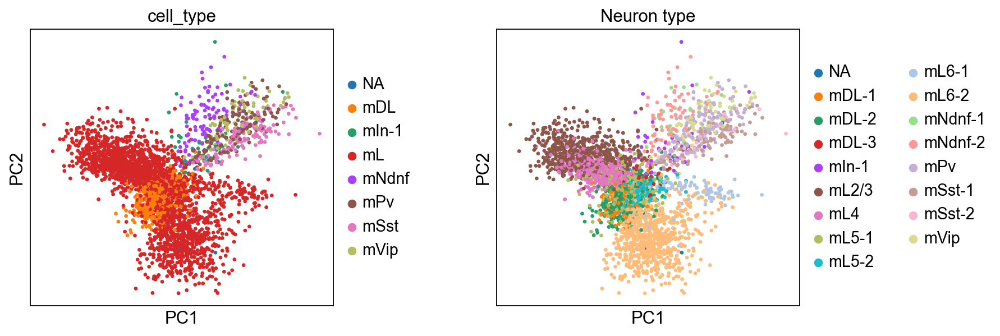

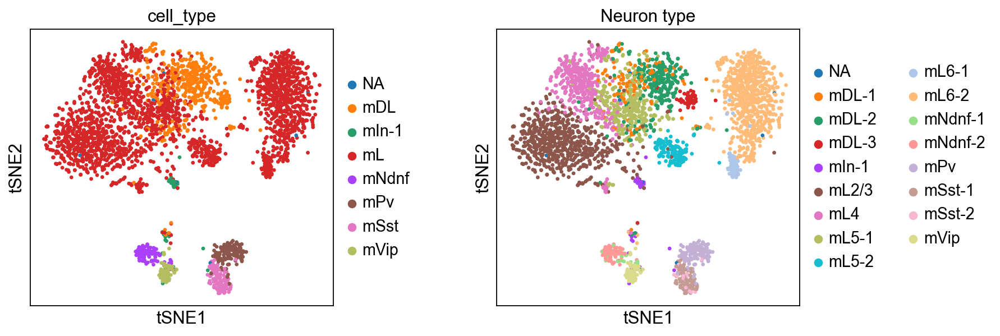

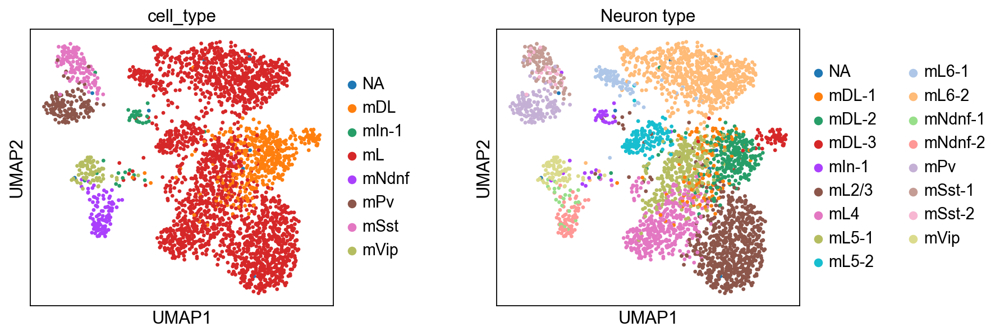

In [32]:
sc.pl.pca(adata, color=['cell_type', 'Neuron type'], wspace=0.4)
sc.pl.tsne(adata, color=['cell_type', 'Neuron type'], wspace=0.4)
sc.pl.umap(adata, color=['cell_type', 'Neuron type'], wspace=0.4)

### Low dimensional representation 
recomputing with different version of package dependencies

In [33]:
epi.pp.lazy(adata, method='umap')

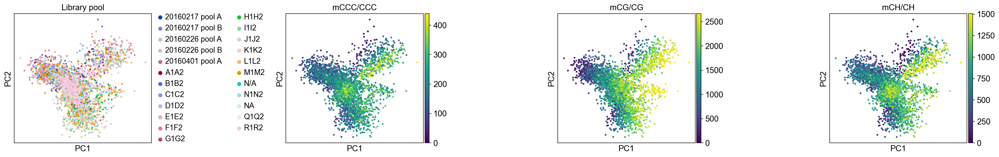

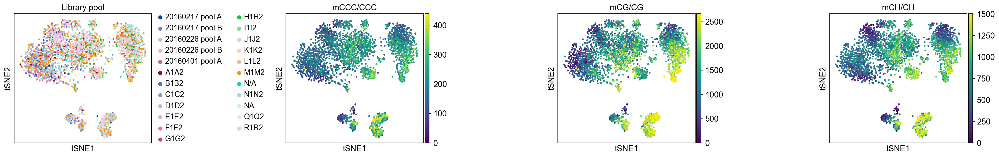

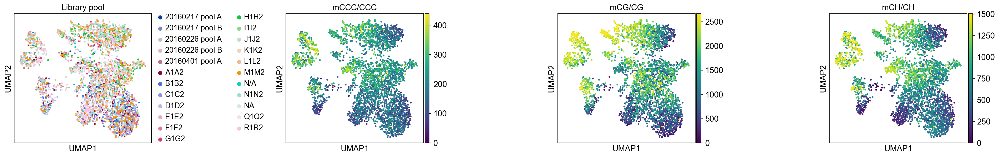

In [34]:
# covariates
sc.pl.pca(adata, color=['Library pool', 'mCCC/CCC', 'mCG/CG', 'mCH/CH'], wspace=0.8)
sc.pl.tsne(adata, color=['Library pool', 'mCCC/CCC', 'mCG/CG', 'mCH/CH'], wspace=0.8)
sc.pl.umap(adata, color=['Library pool', 'mCCC/CCC', 'mCG/CG', 'mCH/CH'], wspace=0.8)

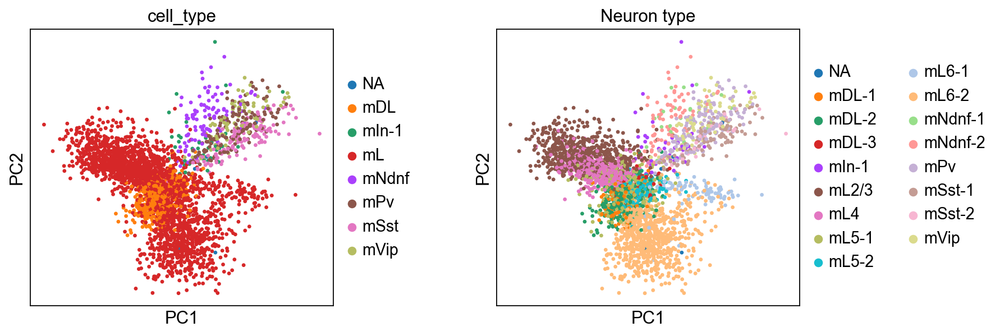

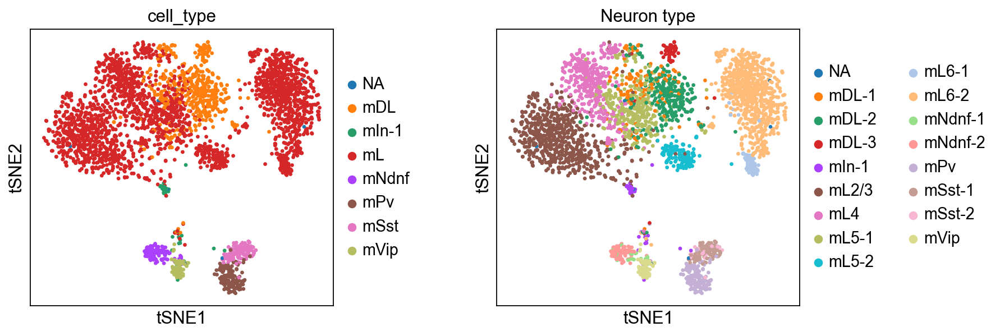

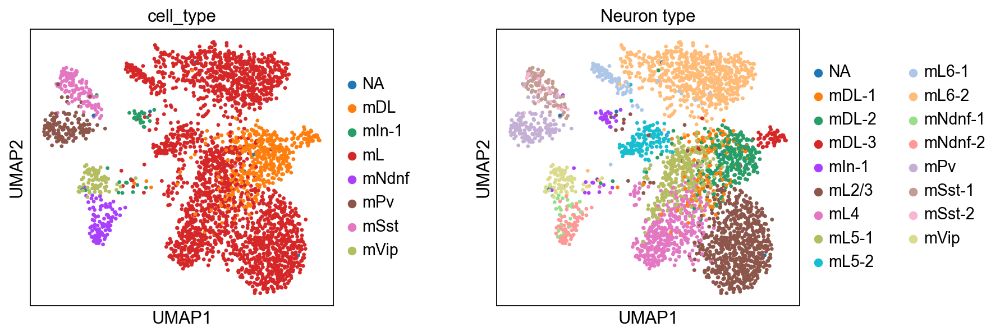

In [35]:
sc.pl.pca(adata, color=['cell_type', 'Neuron type'], wspace=0.4)
sc.pl.tsne(adata, color=['cell_type', 'Neuron type'], wspace=0.4)
sc.pl.umap(adata, color=['cell_type', 'Neuron type'], wspace=0.4)

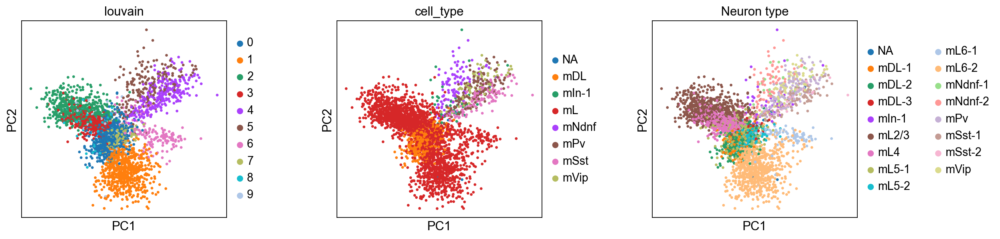

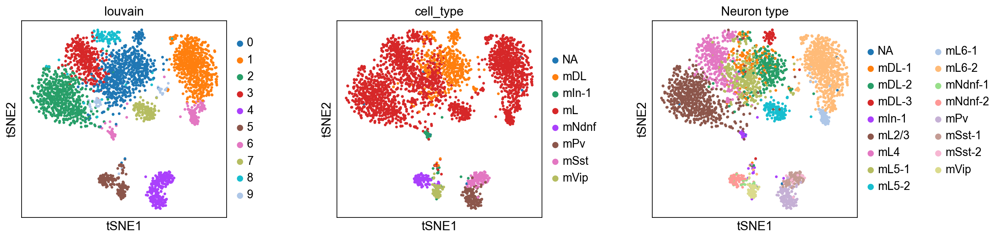

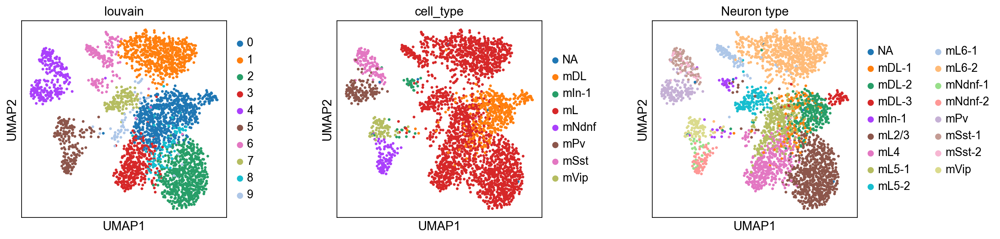

In [36]:
epi.tl.louvain(adata, resolution=1)
sc.pl.pca(adata, color=['louvain', 'cell_type', 'Neuron type'], wspace=0.4)
sc.pl.tsne(adata, color=['louvain', 'cell_type', 'Neuron type'], wspace=0.4)
sc.pl.umap(adata, color=['louvain', 'cell_type', 'Neuron type'], wspace=0.4)

In [37]:
epi.tl.rank_features(adata, 'louvain')


    			When the parameters where not specified in input


()

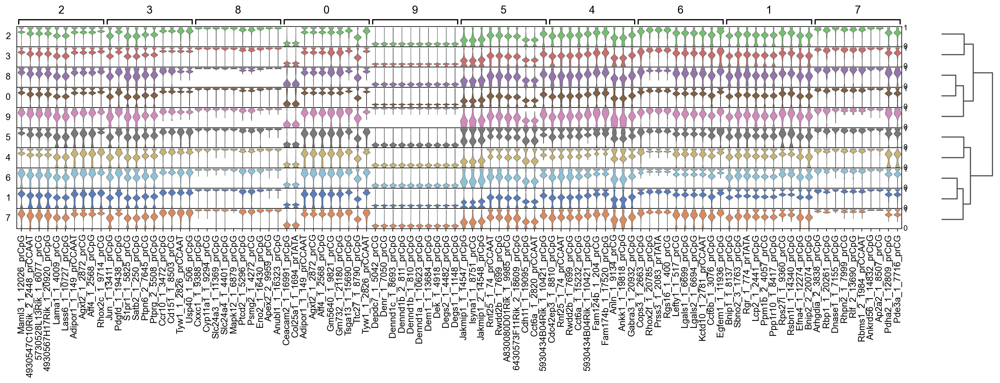

In [38]:
epi.pl.rank_feat_groups_stacked_violin(adata)

### Low resolution clustering

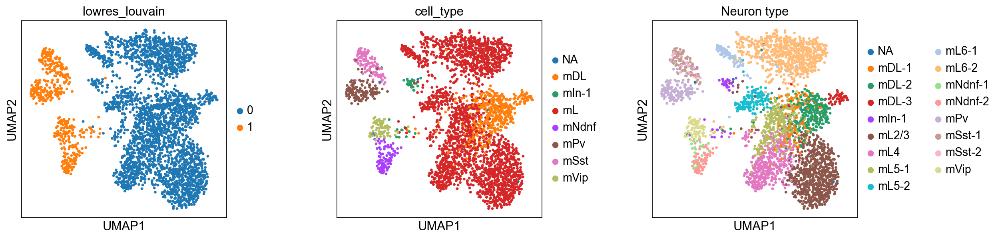

In [49]:
epi.tl.louvain(adata, resolution=0.05, key_added='lowres_louvain')
sc.pl.umap(adata, color=['lowres_louvain', 'cell_type', 'Neuron type'], wspace=0.4)

In [50]:
epi.tl.rank_features(adata, 'lowres_louvain')


    			When the parameters where not specified in input


()

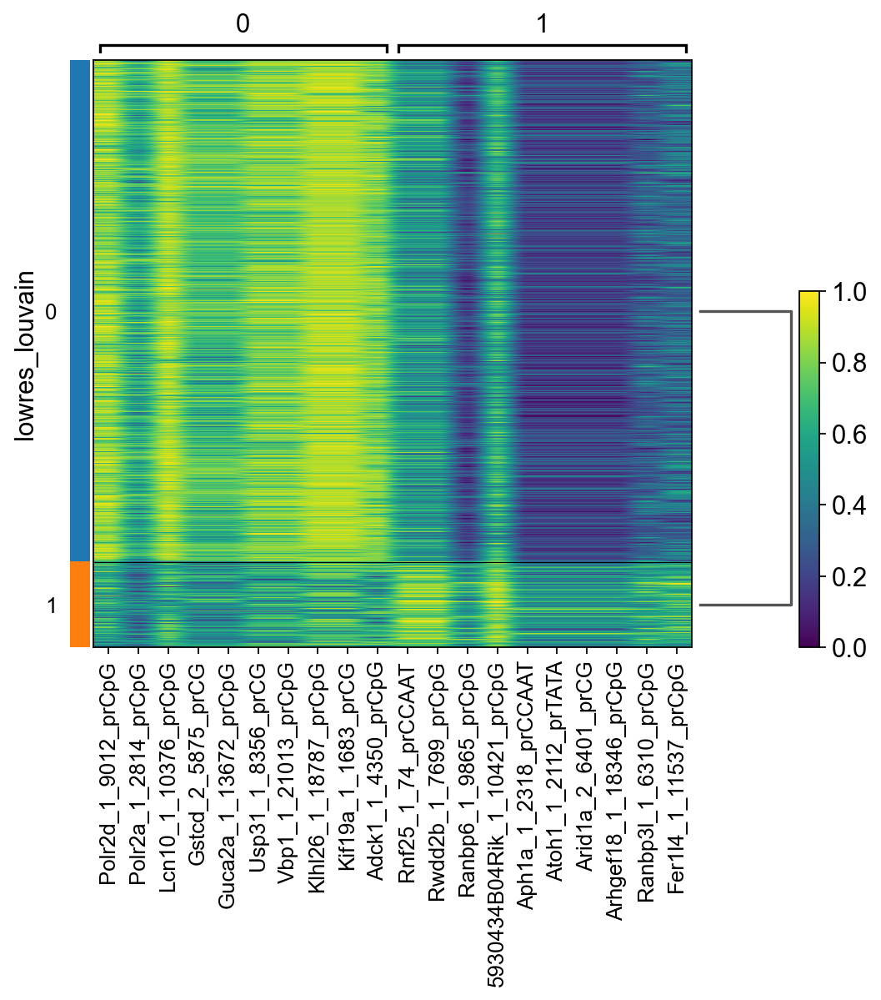

In [51]:
epi.pl.rank_feat_groups_heatmap(adata)

### Comparison standard Louvain and cell type identificaition from Luo et al.

In [46]:
pd.crosstab(adata.obs['Neuron type'], adata.obs['louvain'])

louvain,0,1,2,3,4,5,6,7,8,9
Neuron type,,,,,,,,,,
NA,2,2,2,0,1,1,1,0,0,0
mDL-1,100,0,0,7,0,0,0,0,13,3
mDL-2,249,1,0,0,0,2,0,0,17,7
mDL-3,55,1,0,0,0,0,0,0,1,0
mIn-1,0,0,0,0,2,11,27,0,0,1
mL2/3,26,0,608,6,0,1,13,2,11,12
mL4,37,0,9,300,0,2,0,0,37,14
mL5-1,227,0,0,48,0,0,1,0,17,7
mL5-2,1,0,0,0,0,0,2,132,0,1


error in the argument ax_norm or it is col and 
              I haven't figure out how to make it for mow.
              , here is the heatmap with no normalisation


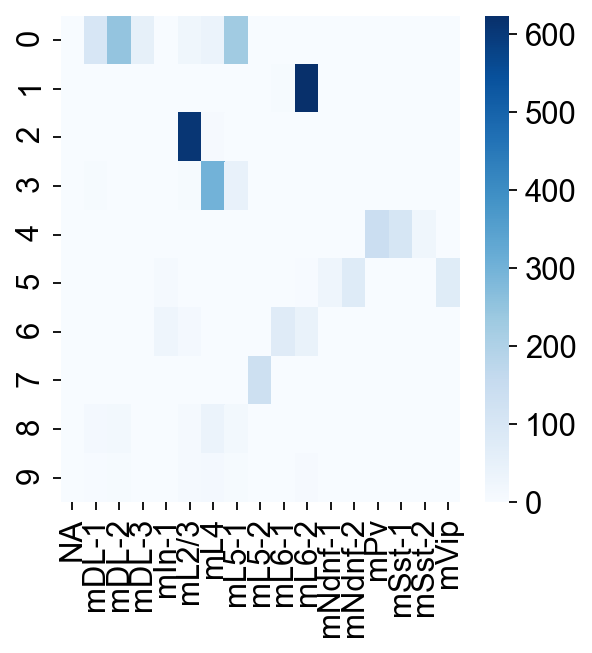

In [45]:
epi.pl.overlap_heatmap(adata, 'louvain', 'Neuron type',
                       color='Blues', norm=True,
                       ax_norm='line', sort_index=True)

# Load enhancers mCG methylation

In [13]:
DATADIR = '/Volumes/Maxtor/paper_data_methylation_episcanpy/'
adata2 = ad.read(DATADIR+'imputed_min500cells_min10000enhancers_normalised.h5ad')

In [14]:
adata2

AnnData object with n_obs × n_vars = 3346 × 54710 
    obs: 'cell_type', 'Library pool', 'Index i5', 'Index i7', 'i5 sequence', 'i7 sequence', 'random primer index', 'random primer index sequence', 'Total reads', 'Mapped reads', 'Filtered reads', 'mCCC/CCC', 'mCG/CG', 'mCH/CH', 'Estimated mCG/CG', 'Estimated mCH/CH', 'Neuron type', 'tSNE x coordinate', 'tSNE y coordinate\n', 'binary', 'coverage_cells', 'mean_cell_methylation'
    var: 'coverage_feature', 'mean_feature_methylation'
    uns: 'Estimated mCG', 'Estimated mCH', 'Index i5_colors', 'Index i7_colors', 'Library pool_colors', 'Neuron type_colors', 'cell_type_colors', 'i5 sequence_colors', 'i7 sequence_colors', 'mCCC', 'mCG', 'mCH', 'neighbors', 'omic', 'pca'
    obsm: 'X_pca', 'X_tsne', 'X_umap'
    varm: 'PCs'

In [21]:
epi.tl.louvain(adata2, resolution=0.8)

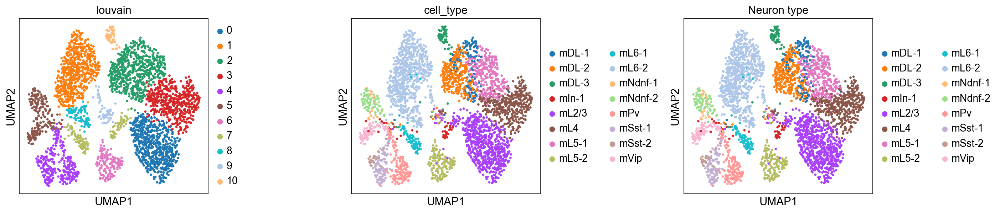

In [22]:
sc.pl.umap(adata2, color=['louvain', 'cell_type', 'Neuron type'], wspace=0.6)

In [24]:
epi.tl.rank_features(adata2, 'louvain')

()

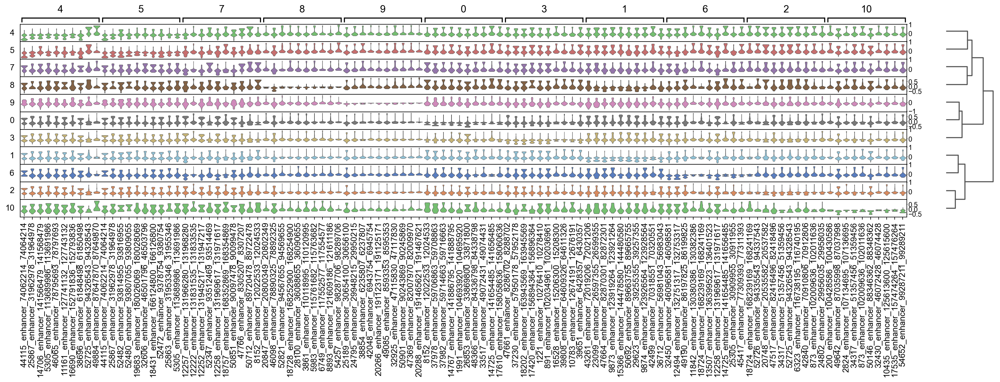

In [27]:
epi.pl.rank_feat_groups_stacked_violin(adata2)

In [43]:
pd.crosstab(adata2.obs['Neuron type'], adata2.obs['louvain'])

louvain,0,1,2,3,4,5,6,7,8,9,10
Neuron type,,,,,,,,,,,
mDL-1,0,0,122,3,0,1,0,0,0,1,0
mDL-2,0,0,284,0,0,1,0,1,0,3,0
mDL-3,0,0,1,0,0,0,0,2,0,2,54
mIn-1,0,0,0,0,2,10,0,29,1,0,0
mL2/3,631,0,2,8,0,1,3,25,0,9,0
mL4,10,0,1,381,0,0,0,1,0,14,0
mL5-1,0,0,189,110,0,0,0,0,0,10,0
mL5-2,0,0,0,0,0,0,137,0,0,5,0
mL6-1,0,5,0,0,0,0,0,79,1,1,0


error in the argument ax_norm or it is col and 
              I haven't figure out how to make it for mow.
              , here is the heatmap with no normalisation


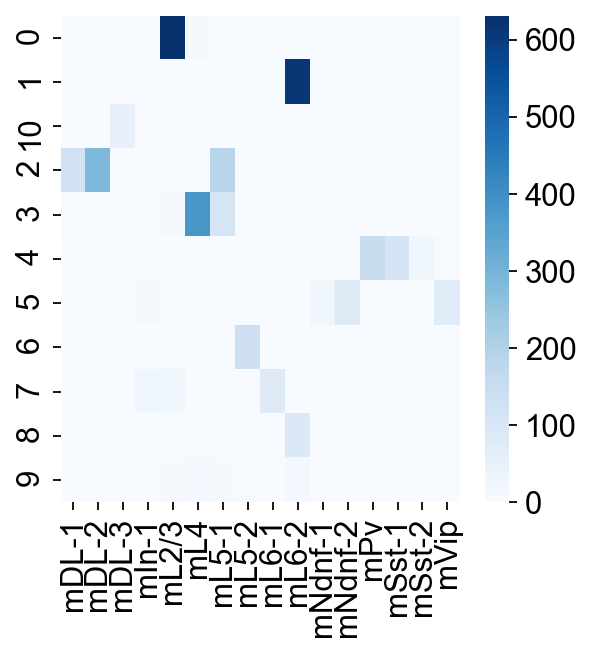

In [44]:
epi.pl.overlap_heatmap(adata2, 'louvain', 'Neuron type',
                       color='Blues', norm=True,
                       ax_norm='line', sort_index=True)